In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
from sklearn.preprocessing import MinMaxScaler
from neurokit2 import ecg_quality, ecg_clean, ecg_process, ecg_analyze, ecg_plot, entropy_sample, entropy_approximate, signal_detrend, signal_power, signal_psd
from joblib import Parallel, delayed
from tqdm import tqdm
import heartpy as hp
from scipy.signal import resample
import math
pd.set_option('display.max_columns', None)

Read data

In [2]:
X_train = pd.read_csv('X_test.csv', dtype=np.float32).drop(labels='id', axis=1).to_numpy()
y_train = np.ravel(pd.read_csv('y_train.csv').drop(labels='id', axis=1).to_numpy())

This is the part where inversion, non-inversion of the ECG data is detected (currently it's not used anywhere else)

In [3]:
list = [None]*X_train.shape[0]
for i in range(X_train.shape[0]):
    train_row = X_train[i,:]
    train_row = train_row[~np.isnan(train_row)]
    filtered = hp.filter_signal(train_row, cutoff = 0.05, sample_rate = 300, filtertype='notch')
    resampled_data = resample(filtered, len(filtered) * 5)
    scaled_data = hp.scale_data(resampled_data)
    crashed_norm = False
    crashed_inv = False
    try:
        wd1, m1 = hp.process(scaled_data, 5*300)
    except: # ECG is probably inverted since analysis on the non-inverted data crashed
        crashed_norm = True
        print(str(i) + " norm crashed")

    wd1cp = wd1.copy()
    m1cp = m1.copy()
    try:
        wd2, m2 = hp.process(hp.scale_data(resampled_data*-1), 5*300)
    except: # ECG is probably not inverted since analysis on the inverted data crashes
        crashed_inv = True
        print(str(i) + " inv crashed")

    if crashed_norm and crashed_inv: #This should never happen
        continue

    if crashed_norm:
        list[i] = m2cp
        continue
    if crashed_inv:
        list[i] = m1cp
        continue

    m2cp = m2.copy()
    l_normal = np.mean(np.abs(wd1cp['ybeat']-np.mean(scaled_data)))
    l_inv = np.mean(np.abs(scaled_data[wd2['peaklist']]-np.mean(scaled_data)))
    # Analysis didn't crash for inverted nor non-inverted data, in this case use heuristic to decide which case applies
    if l_normal >= l_inv:
        if math.isnan(m1cp['ibi']): # print for manual inspection
            print(str(i) + " is normal")
            print(i)
        list[i] = m1cp
    else:
        if math.isnan(m2cp['ibi']): # print for manual inspection
            print(str(i) + " is inverted")
            print(i)
        list[i] = m2cp

79 is inverted
79
310 norm crashed
385 inv crashed
452 is normal
452
452 many beats removed
505 many beats removed
506 many beats removed
584 is inverted
584
587 many beats removed
695 many beats removed
852 many beats removed
873 many beats removed
877 many beats removed
908 many beats removed
987 inv crashed
1020 norm crashed
1029 is inverted
1029
1193 many beats removed
1243 many beats removed
1265 many beats removed
1285 many beats removed
1718 many beats removed
1751 many beats removed
1777 many beats removed
1852 many beats removed
1975 is inverted
1975
2055 many beats removed
2069 inv crashed
2097 many beats removed
2124 many beats removed
2238 many beats removed
2262 is inverted
2262
2336 many beats removed
2403 many beats removed
2515 many beats removed
2551 many beats removed
2571 many beats removed
2605 many beats removed
2765 is normal
2765
2765 many beats removed
2789 many beats removed
2800 norm crashed
2806 many beats removed
2844 many beats removed
2858 many beats remov

Space for manual inspection of strange samples

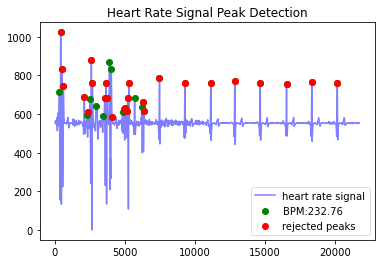

In [28]:
train_row = X_train[79,:]
train_row = train_row[~np.isnan(train_row)]
filtered = hp.filter_signal(train_row, cutoff = 0.05, sample_rate = 300, filtertype='notch', order=2)
filtered = signal_detrend(filtered, method='polynomial', order=1)
resampled_data = resample(filtered, len(filtered)*5)
scaled_data = hp.scale_data(resampled_data)
wd1, m1 = hp.process(scaled_data, 5*300)
hp.plotter(wd1, m1)
#hp.segment_plotter(wd1, m1)

Some experimentation with spectrograms (one of the papers uses spectrograms to discard noisy intervals in data)

In [33]:
f, t, Sxx = spectrogram(train_row, 300, mode='magnitude', detrend='linear', scaling='spectrum', nperseg=100)

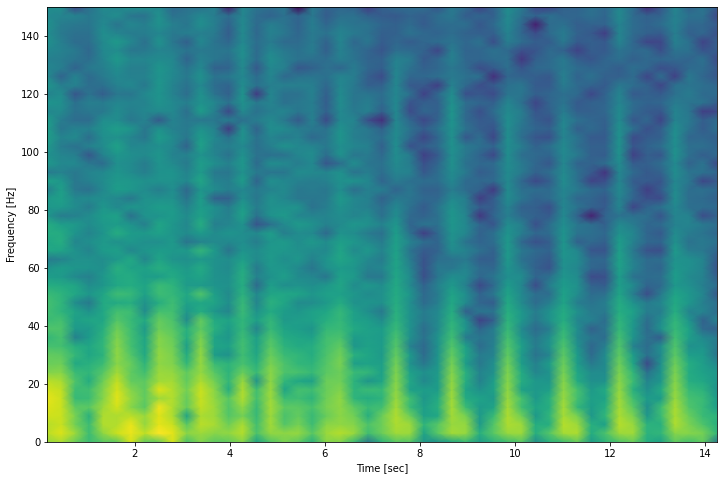

In [34]:
plt.figure(figsize=(12,8))
plt.pcolormesh(t, f, np.log10(Sxx), shading='gouraud')

plt.ylabel('Frequency [Hz]')

plt.xlabel('Time [sec]')

plt.show()

Space for manual inspection with Neurokit

In [48]:
train_row = X_train[13,:]
train_row = train_row[~np.isnan(train_row)]
signals, info = ecg_process(train_row, sampling_rate=300)
new_row = ecg_analyze(signals, sampling_rate=300, method='interval-related')

In [49]:
new_row

,ECG_Rate_Mean,HRV_RMSSD,HRV_MeanNN,HRV_SDNN,HRV_SDSD,HRV_CVNN,HRV_CVSD,HRV_MedianNN,HRV_MadNN,HRV_MCVNN,HRV_IQRNN,HRV_pNN50,HRV_pNN20,HRV_TINN,HRV_HTI,HRV_ULF,HRV_VLF,HRV_LF,HRV_HF,HRV_VHF,HRV_LFHF,HRV_LFn,HRV_HFn,HRV_LnHF,HRV_SD1,HRV_SD2,HRV_SD1SD2,HRV_S,HRV_CSI,HRV_CVI,HRV_CSI_Modified,HRV_PIP,HRV_IALS,HRV_PSS,HRV_PAS,HRV_GI,HRV_SI,HRV_AI,HRV_PI,HRV_C1d,HRV_C1a,HRV_SD1d,HRV_SD1a,HRV_C2d,HRV_C2a,HRV_SD2d,HRV_SD2a,HRV_Cd,HRV_Ca,HRV_SDNNd,HRV_SDNNa,HRV_ApEn,HRV_SampEn
0,93.603286,362.692134,677.583333,260.289109,367.120829,0.384143,0.535273,770.0,217.448,0.2824,395.0,70.0,70.0,656.666667,2.0,NaN,NaN,NaN,0.096047,0.049872,NaN,NaN,0.658219,-2.342919,259.593627,258.756108,1.003237,211025.291926,0.996774,6.031305,1031.685161,0.55,0.578947,0.818182,0.090909,52.563727,55.064519,50.095517,42.105263,0.368557,0.631443,157.730616,206.45752,0.605873,0.394127,201.410126,162.445943,0.48673,0.51327,180.893596,185.75978,0.40721,0.426519


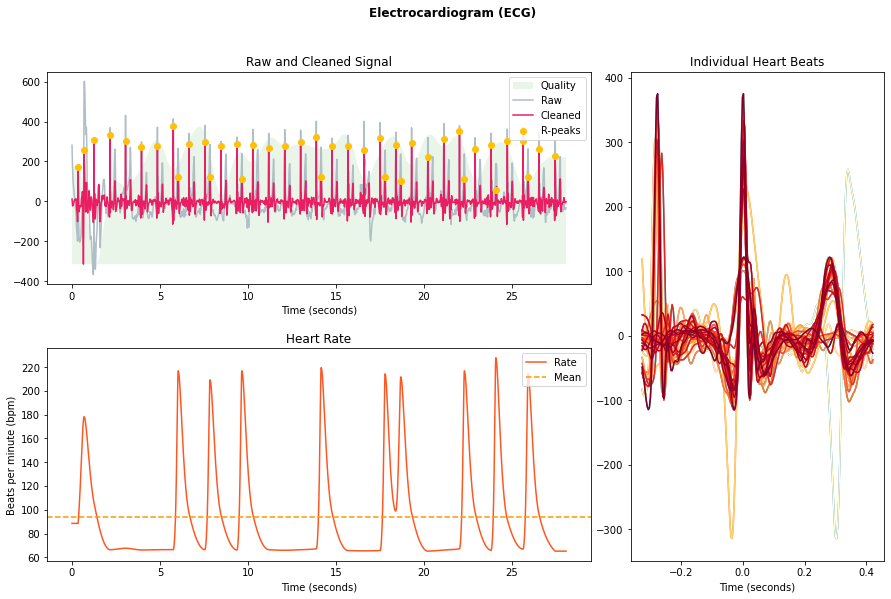

In [50]:
bla = ecg_plot(signals, sampling_rate=300)

Little reminder

In [7]:
#0 is normal
#1 is arterial fibrillation
#2 is other rhythm
#3 is noisy

This is how the features I sent you were generated, but this will probably crash for you...If you don't want this to crash you have to edit the library code to change the 'methods' parameters for cleaning and ECG-peak detection (biosppy for cleaning and neurokit for ECG peak detection shouldn't crash)

In [3]:
def par_fun(r, i):
    s = r[~np.isnan(r)]
    signals, info = ecg_process(s, sampling_rate=300)
    try:
        new_row = ecg_analyze(signals, sampling_rate=300, method='interval-related')
    except:
        raise BaseException(str(i))
    return new_row

frames = Parallel(n_jobs=15)(
    delayed(par_fun)(X_train[i,:], i) for i in tqdm(range(X_train.shape[0])))

100%|██████████| 3411/3411 [05:25<00:00, 10.48it/s]


In [4]:
res = pd.DataFrame()
for p in frames:
    res = res.append(p)

In [5]:
res.to_csv('features_test.csv')